In [1]:
import cafe

output_dir = "./output/26.03.20-case_gastrulation_visualization"
img_dir = "./img/26.03.20-case_gastrulation_visualization"

INFO                                                                                                                                                                                                    
             ██████╗ █████╗ ███████╗███████╗                                                                                                                                                            
           ██╔════╝██╔══██╗██╔════╝██╔════╝                                                                                                                                                             
           ██║     ███████║█████╗  █████╗                                                                                                                                                               
           ██║     ██╔══██║██╔══╝  ██╔══╝                                                                                                                                                           

In [2]:
model_name = "merge"

# read raw fadata
filename = "output/26.02.02-gastrulation_case_data/gastrulation.h5ad"
fadata = cafe.data.read_h5ad(filename)

# load trajectory dict
fadata.load_trajectory_dict(model_name)

# subsample for quick visualization
# subsampled_filename = f"{output_dir}/gastrulation_merge_subsampled.h5ad"
# fadata = cafe.preprocess.subsample_fadata(fadata, n_obs=3000)
# fadata.write_h5ad(subsampled_filename)
# fadata = cafe.data.read_h5ad(subsampled_filename)

# milestone color setting
cluster_key = "celltype"
milestone_color_dict = dict(zip(fadata.obs[cluster_key].cat.categories, fadata.uns[f"{cluster_key}_colors"]))
mw = fadata.get_milestone_wrapper(model_name=model_name)
mw._milestone_color_dict = milestone_color_dict

fadata.model_name = model_name

fadata

AnnData object with n_obs × n_vars = 89267 × 53801
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'cell_velocyto_loom', 'celltype_coarse', 'celltype_new', 'pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'cafe', 'celltype_coarse_colors', 'celltype_colors', 'celltype_new_colors', 'id'
    obsm: 'X_pca', 'X_stavia', 'X_umap'
    layers: 'spliced', 'unspliced'

NetworkX直接查看里程碑网络

In [3]:
# import matplotlib.pyplot as plt
# import networkx as nx

# mw = fadata.get_milestone_wrapper(model_name)
# mw

# plt.figure(figsize=(18, 15))
# G = nx.from_pandas_edgelist(
#     df=mw.milestone_network,
#     source="from",
#     target="to",
#     edge_attr=["length"],
#     create_using=nx.DiGraph
# )
# nx.draw_networkx(G, pos=nx.nx_agraph.graphviz_layout(G, prog="dot"))

使用可视化

array([[<Axes: title={'center': 'merge(celltype)'}, xlabel='X_umap1', ylabel='X_umap2'>]],
      dtype=object)

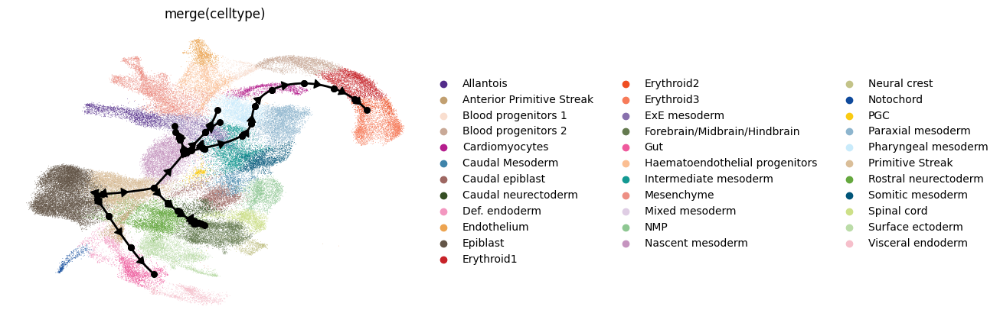

In [10]:
cafe.plot.plot_trajectory(fadata, save=f"{img_dir}/plot_trajectory.pdf")

array([[<Axes: title={'center': 'merge(celltype)'}, xlabel='_milestone_network_emb1', ylabel='_milestone_network_emb2'>]],
      dtype=object)

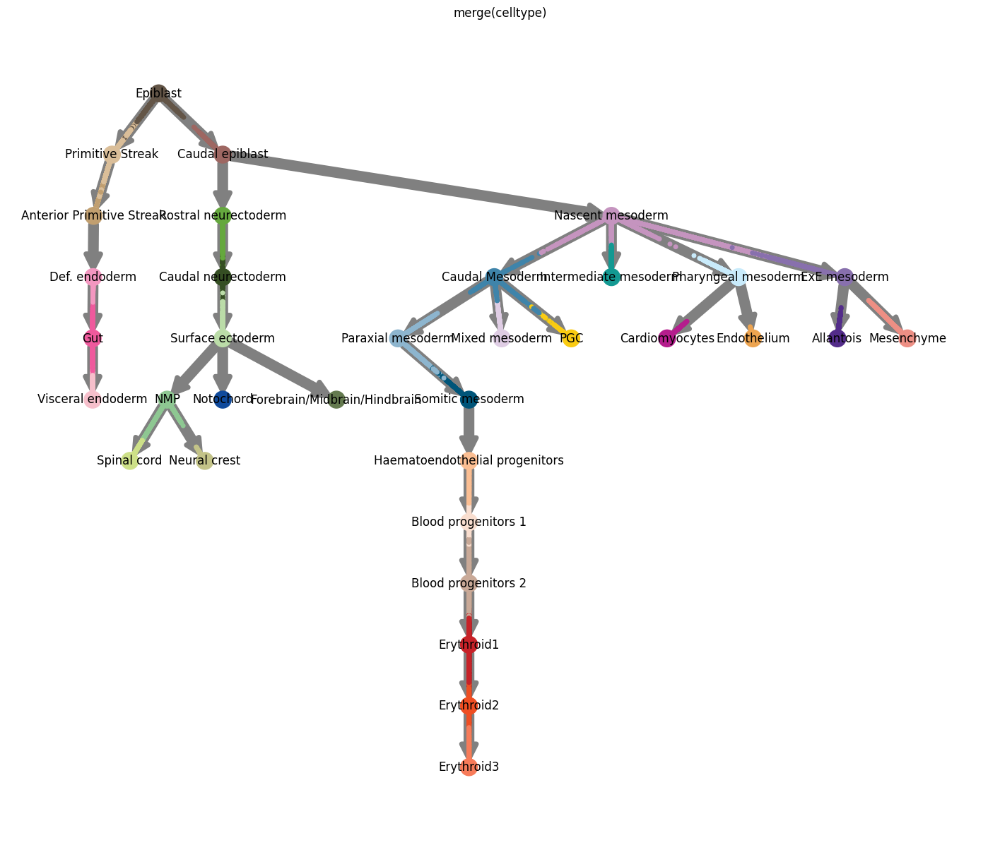

In [ ]:
sc_pl_embedding_kwargs = {
    "figsize": (18, 15),
    "size": 100,
    "legend_loc": None,
}

cafe.plot.plot_graph(
    fadata,
    adjust_edge_length_for_layout=False, # 自动调整轨迹布局，不是很好
    save=f"{img_dir}/plot_graph.pdf",
    **sc_pl_embedding_kwargs
)
cafe.plot.plot_graph(
    fadata,
    adjust_edge_length_for_layout=False, # 自动调整轨迹布局，不是很好
    save=f"{img_dir}/plot_graph_without_label.pdf",
    nx_draw_kwargs={"with_label": False}
    **sc_pl_embedding_kwargs
)

Waddington Landscape

In [12]:
# TODO:
# add prior information for better pseudotime
# cafe.plot.plot_embedding_plotly(fadata)
prior_information = {
    "start_milestone": "Epiblast",
    "start_cell": "cell_71089",
}
fadata.add_prior_information(**prior_information)

pseudotime_key = "trajectory_pseudotime"
fadata.obs[pseudotime_key] = fadata.get_trajectory_pseudotime()

cafe.plot.plot_waddington_landscape_3d(
    fadata,
    pseudotime_key=pseudotime_key,
    trajectory_model=model_name,
    smooth_pseudotime=True,
    landscape_opacity=0.8,
    milestone_text_size=-1,
    arrow_size=0.5,
    milestone_size=2,
    target_z_to_xy_ratio=0.1,
    save_path=f"{img_dir}/waddington_landscape_3d.html",
)

Using provided pseudotime_key 'trajectory_pseudotime' in fadata.obs
Figure saved to ./img/26.03.20-case_gastrulation_visualization/waddington_landscape_3d.html
